In [55]:
import imp
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# pip install plotly
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode,iplot
import plotly.express as px
import seaborn as sns
import pandas_profiling as pdp
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
%matplotlib inline

In [56]:
data= pd.read_csv('data.csv')
df=pd.DataFrame(data)
df

,deposit,rent,floor,area,age,rooms,elavator,parking,Warehouse,time,region,all_to_deposit,district
0,320,0.0,1,55,7,1,1,1,0,1657960540,استاد معین,320,9
1,300,0.1,3,45,13,1,0,1,1,1657960572,آذربایجان,303,10
2,300,30.0,2,128,9,3,1,1,1,1657960603,محمودیه,1300,1
3,600,18.0,8,132,16,2,1,1,1,1657960605,فرمانیه,1200,1
4,200,11.0,2,105,7,2,1,1,1,1657960606,شهران شمالی,566,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
165113,1000,25.0,1,135,11,2,1,1,1,1661163972,کامرانیه,1833,1
165114,2300,0.0,3,160,10,3,1,1,1,1661163973,اقدسیه,2300,1
165115,350,0.0,3,92,30,2,0,0,1,1661163975,زاهد گیلانی,350,13
165116,300,25.0,1,110,6,2,1,1,1,1661163975,نیاوران,1133,1


In [57]:
def check(df):
    l=[]
    columns=df.columns
    for col in columns:
        dtypes=df[col].dtypes
        nunique=df[col].nunique()
        sum_null=df[col].isnull().sum()
        l.append([col,dtypes,nunique,sum_null])
    df_check=pd.DataFrame(l)
    df_check.columns=['column','dtypes','nunique','sum_null']
    return df_check 

In [58]:
check(df)

,column,dtypes,nunique,sum_null
0,deposit,int64,635,0
1,rent,float64,580,0
2,floor,int64,32,0
3,area,int64,436,0
4,age,int64,32,0
5,rooms,int64,5,0
6,elavator,int64,2,0
7,parking,int64,2,0
8,Warehouse,int64,2,0
9,time,int64,145672,0


In [59]:
df1=df.copy()
df1=df1.sort_values('district')
df1

,deposit,rent,floor,area,age,rooms,elavator,parking,Warehouse,time,region,all_to_deposit,district
165117,2000,3.0,6,220,8,4,1,1,1,1661163977,فرمانیه,2100,1
83092,350,35.0,1,50,6,1,1,1,0,1659687825,زعفرانیه,1516,1
83090,750,28.0,0,190,31,2,0,0,0,1659687824,الهیه,1683,1
30486,500,35.0,5,150,1,3,1,1,1,1658829955,قیطریه,1666,1
83075,2700,0.0,6,240,14,3,1,1,1,1659687536,زعفرانیه,2700,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
68214,700,7.5,0,150,5,3,1,1,1,1659450205,شهرک راه‌آهن,950,22
94301,300,12.0,12,107,6,2,1,1,1,1660113340,دریاچه شهدای خلیج فارس,700,22
39894,500,12.0,2,140,6,3,1,1,1,1658926524,شهرک راه‌آهن,900,22
94282,1500,30.0,18,170,1,3,1,1,1,1660113256,دریاچه شهدای خلیج فارس,2500,22


In [60]:

#در نگاه اولیه متوجه شدم که یه سری خونه ها پول پیش 1 و اجاره ماهانه 0 دارن که مشخصا داده های اشتباه هستن و باید حذف بشن
out1=df1.loc[(df1.deposit==1) & (df1.rent == 0)]
out1

,deposit,rent,floor,area,age,rooms,elavator,parking,Warehouse,time,region,all_to_deposit,district
15499,1,0.0,4,117,13,2,1,1,1,1658575223,قیطریه,1,1
125078,1,0.0,1,130,5,3,1,1,1,1660540329,شهرک غرب,1,2
139126,1,0.0,4,125,0,3,1,1,1,1660737596,دریان‌نو,1,2
101186,1,0.0,4,135,6,2,1,1,1,1660199308,سعادت‌آباد,1,2
104189,1,0.0,1,100,9,2,1,1,1,1660221258,سعادت‌آباد,1,2
104362,1,0.0,1,112,4,2,1,1,1,1660222400,سعادت‌آباد,1,2
103052,1,0.0,6,130,3,2,1,1,1,1660212541,اختیاریه,1,2
97933,1,0.0,3,170,11,3,1,1,1,1660138567,پاسداران,1,3
76173,1,0.0,3,125,11,2,1,1,1,1659556876,دروس,1,3
108147,1,0.0,0,11,1,0,1,1,1,1660298850,تهرانپارس شرقی,1,4


In [61]:
#حذف داده های پرت پیدا شده
df1=df1.drop(out1.index)

In [62]:
# خونه هایی که مساحت آنها زیر 10 متر بودن نیز حذف میکنیم چون به نظر نمی آید خونه ای زیر این متراژ واقعی باشد
out3=df1.loc[df1.area<30]
out3

,deposit,rent,floor,area,age,rooms,elavator,parking,Warehouse,time,region,all_to_deposit,district
85317,50,3.0,0,20,3,1,1,0,1,1659762121,اراج,150,1
31773,500,50.0,4,22,16,3,1,1,1,1658837291,الهیه,2166,1
78695,400,14.5,3,9,13,2,1,1,1,1659603098,قیطریه,883,1
60317,50,5.0,0,29,16,0,0,0,0,1659335820,کامرانیه,216,1
55800,2500,0.0,3,15,5,3,1,1,1,1659252454,الهیه,2500,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
124701,5,1.5,0,10,0,0,0,0,0,1660534775,چیتگر,55,21
124736,2,0.4,0,12,11,0,1,1,0,1660536138,شهرک آزادی,15,21
72056,100,5.0,-1,20,31,0,0,0,0,1659515247,تهران‌سر,266,21
42039,0,0.4,-1,20,6,0,1,1,0,1658946646,شهرک راه‌آهن,13,22


In [63]:
df1=df1.drop(out3.index)


In [64]:
df1['per_area']=df1.apply(lambda r: float(r['all_to_deposit']/r['area']),axis=1)
df1

,deposit,rent,floor,area,age,rooms,elavator,parking,Warehouse,time,region,all_to_deposit,district,per_area
165117,2000,3.0,6,220,8,4,1,1,1,1661163977,فرمانیه,2100,1,9.545455
83092,350,35.0,1,50,6,1,1,1,0,1659687825,زعفرانیه,1516,1,30.320000
83090,750,28.0,0,190,31,2,0,0,0,1659687824,الهیه,1683,1,8.857895
30486,500,35.0,5,150,1,3,1,1,1,1658829955,قیطریه,1666,1,11.106667
83075,2700,0.0,6,240,14,3,1,1,1,1659687536,زعفرانیه,2700,1,11.250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68214,700,7.5,0,150,5,3,1,1,1,1659450205,شهرک راه‌آهن,950,22,6.333333
94301,300,12.0,12,107,6,2,1,1,1,1660113340,دریاچه شهدای خلیج فارس,700,22,6.542056
39894,500,12.0,2,140,6,3,1,1,1,1658926524,شهرک راه‌آهن,900,22,6.428571
94282,1500,30.0,18,170,1,3,1,1,1,1660113256,دریاچه شهدای خلیج فارس,2500,22,14.705882


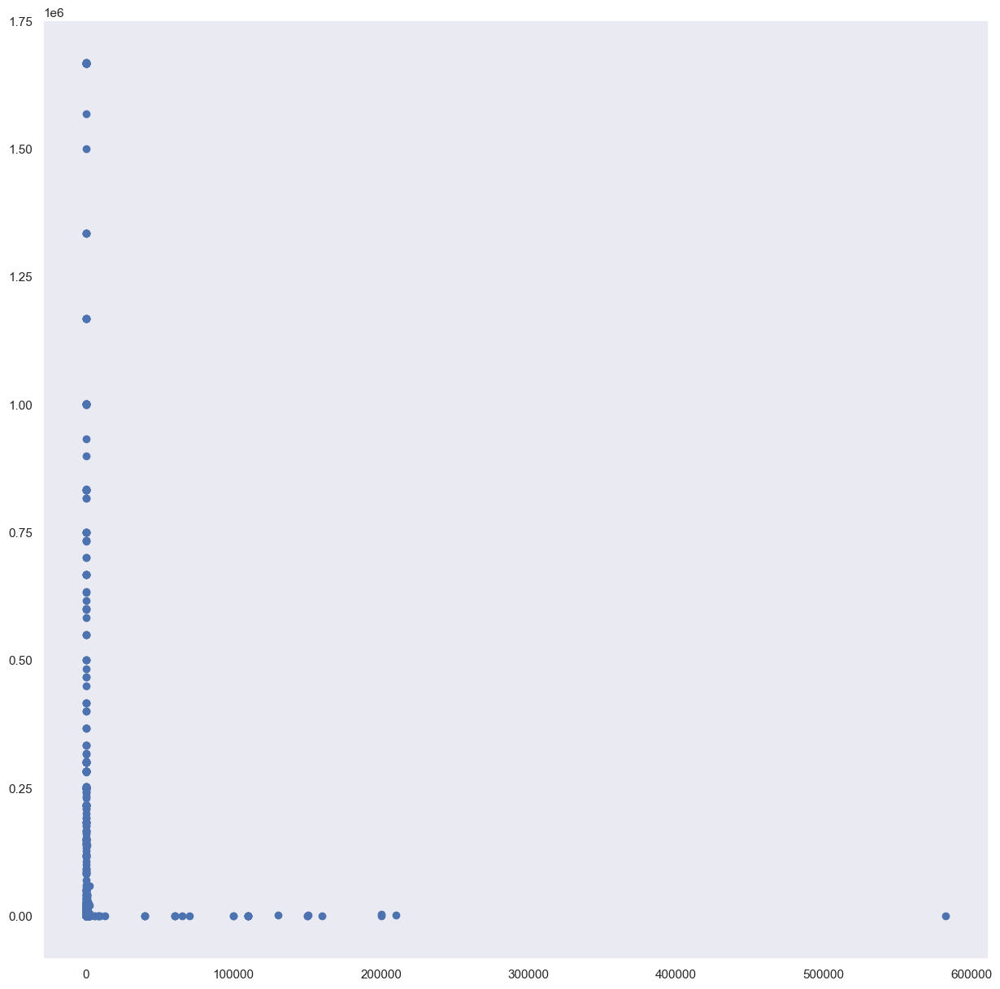

In [65]:
plt.scatter(df1.area,df1.all_to_deposit)

In [66]:
#یک داده در محدوده مساحتی بالای 500000  متر وجود داره که به نظر داده پرت میاد و حذفش میکنیم
out2=df1.loc[df1.area>500000]
out2

,deposit,rent,floor,area,age,rooms,elavator,parking,Warehouse,time,region,all_to_deposit,district,per_area
119064,250,3.8,3,582500,15,1,0,0,1,1660459455,هفت حوض,376,8,0.000645


In [67]:
df1=df1.drop(out2.index)


In [68]:
le=LabelEncoder()
df1['address']= le.fit_transform(df1['region'])
region=df1.pop('region')
# ستون تایم هم حذف میکنیم
time=df1.pop('time')
df1

,deposit,rent,floor,area,age,rooms,elavator,parking,Warehouse,all_to_deposit,district,per_area,address
165117,2000,3.0,6,220,8,4,1,1,1,2100,1,9.545455,247
83092,350,35.0,1,50,6,1,1,1,0,1516,1,30.320000,137
83090,750,28.0,0,190,31,2,0,0,0,1683,1,8.857895,29
30486,500,35.0,5,150,1,3,1,1,1,1666,1,11.106667,258
83075,2700,0.0,6,240,14,3,1,1,1,2700,1,11.250000,137
...,...,...,...,...,...,...,...,...,...,...,...,...,...
68214,700,7.5,0,150,5,3,1,1,1,950,22,6.333333,192
94301,300,12.0,12,107,6,2,1,1,1,700,22,6.542056,123
39894,500,12.0,2,140,6,3,1,1,1,900,22,6.428571,192
94282,1500,30.0,18,170,1,3,1,1,1,2500,22,14.705882,123


In [69]:
temp = df1.describe()
temp.style.background_gradient(cmap='Oranges')

,deposit,rent,floor,area,age,rooms,elavator,parking,Warehouse,all_to_deposit,district,per_area,address
count,164862.000000,164862.000000,164862.000000,164862.000000,164862.000000,164862.000000,164862.000000,164862.000000,164862.000000,164862.000000,164862.000000,164862.000000,164862.000000
mean,702.012107,33.828305,3.179144,133.730035,9.838131,2.157119,0.764530,0.849140,0.891455,1829.406067,5.658017,14.083827,183.779397
std,1006.262983,736.672740,2.557606,1461.623889,6.969287,0.772434,0.424293,0.357913,0.311069,24580.238459,5.548579,171.360917,102.346100
min,0.000000,0.000000,-1.000000,30.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,0.002530,0.000000
25%,250.000000,0.000000,2.000000,75.000000,4.000000,2.000000,1.000000,1.000000,1.000000,493.000000,2.000000,6.066949,90.000000
50%,480.000000,7.000000,3.000000,105.000000,9.000000,2.000000,1.000000,1.000000,1.000000,800.000000,4.000000,7.963235,161.000000
75%,800.000000,18.000000,4.000000,140.000000,15.000000,3.000000,1.000000,1.000000,1.000000,1366.000000,7.000000,10.440000,292.000000
max,50000.000000,50000.000000,30.000000,210170.000000,31.000000,4.000000,1.000000,1.000000,1.000000,1668166.000000,22.000000,13337.328000,342.000000


In [70]:
g1 = [go.Box(y=df1.rooms,name="rooms",marker=dict(color="rgba(51,0,0,0.9)"),hoverinfo="name+y")]
g2 = [go.Box(y=df1.floor,name="floor",marker=dict(color="rgba(0,102,102,0.9)"),hoverinfo="name+y")]
g3 = [go.Box(y=df1.age,name="age",marker=dict(color="rgba(9,80,58,12.2)"),hoverinfo="name+y")]
layout2 = go.Layout(title="Houses",yaxis=dict(range=[0,13])) 
fig2 = go.Figure(data=g1+g2+g3,layout=layout2)
iplot(fig2)

#این پلات پایین رو میتونین روش زوم بکنید یا جا به جاش کنین یا کوچیکش کنین... 

In [71]:
fig2 = px.histogram(df1,x='district',color='district',template='plotly_dark')
fig2.show()

In [72]:
fig2 = px.histogram(df1,x='rooms',color='rooms',template='plotly_dark')
fig2.show()

In [73]:
fig2 = px.histogram(df1,x='floor',color='floor',template='plotly_dark')
fig2.show()
#توی این پلات میبینیم که یه سری اتاق ها -1 خوردن ... اینا رو باید حذف کنیم

In [74]:
out4=df1.loc[df1.floor<0]
df1=df1.drop(out4.index)
#حذف شدن

In [75]:
fig2 = px.histogram(df1,x='age',color='age',template='plotly_dark')
fig2.show()

In [76]:
fig2 = px.histogram(df1,x='parking',color='parking',template='plotly_dark')
fig2.show()

In [77]:
fig2 = px.histogram(df1,x='Warehouse',color='Warehouse',template='plotly_dark')
fig2.show()

c:\Users\Mahdi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



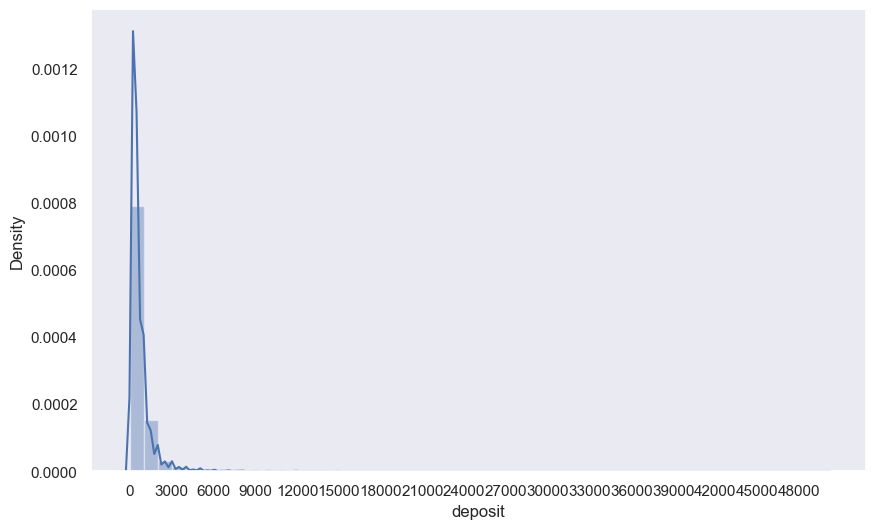

In [78]:
plt.figure(figsize=(10, 6))
sns.distplot(df1['deposit'])
plt.xticks(np.arange(df1['deposit'].min(), df1['deposit'].max(), step=3000));

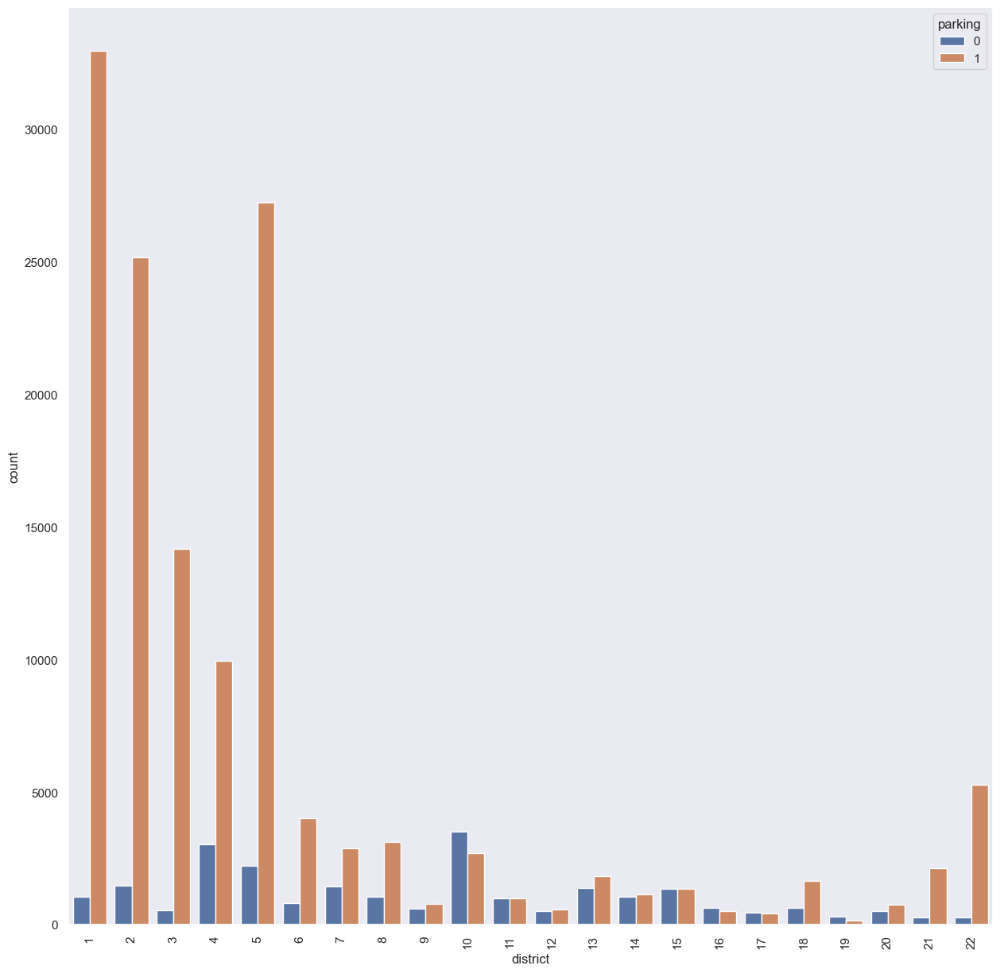

In [79]:
sns.countplot(data=df1,x="district",hue='parking')
sns.set(rc={'figure.figsize':(15,15)})
plt.xticks(rotation=90)
plt.show()

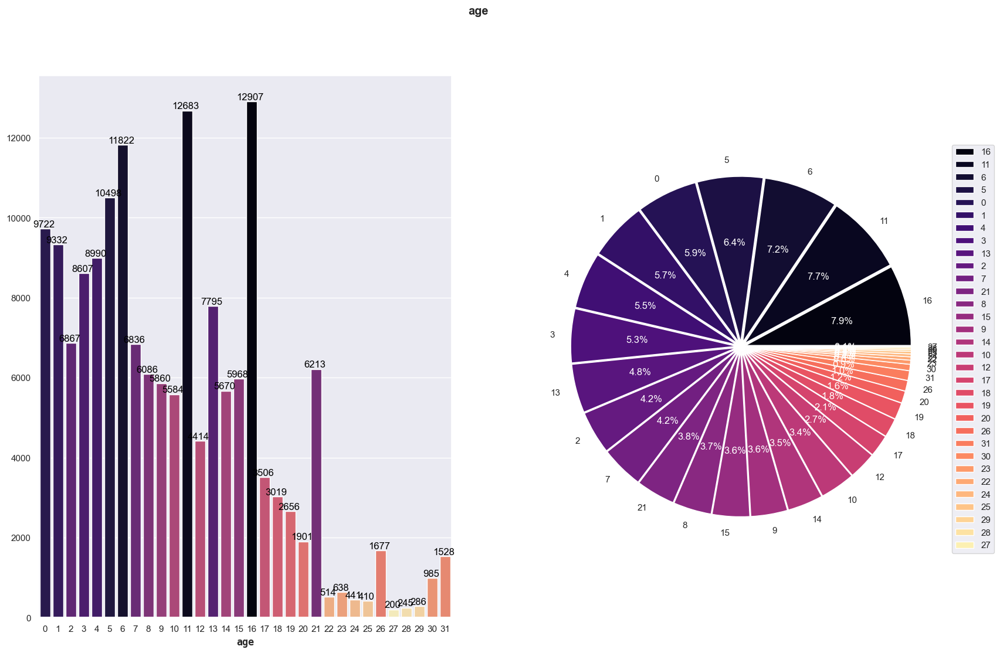

In [80]:
fig, ax = plt.subplots(1, 2, figsize=(20,12))
x=df1['age'].value_counts().index
y=df1['age'].value_counts().values.tolist()
data = df1.groupby("age").size()
sns.set(style="dark", color_codes=True)
pal = sns.color_palette("magma", len(data))
rank = data.argsort().argsort() 
sns.barplot(x=x,y=y,palette=np.array(pal[::-1])[rank],ax = ax[0])
for p in ax[0].patches:
        ax[0].annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')
ax[0].set_xlabel('age', weight='semibold', fontname = 'monospace')
_, _, autotexts= ax[1].pie(y, labels = x, colors = pal, autopct='%1.1f%%',
        explode=[0.03 for i in df1['age'].value_counts().index])
for autotext in autotexts:
    autotext.set_color('white')
plt.legend(bbox_to_anchor=(1, 1))
plt.suptitle ('age',weight = 'bold')
plt.show()

In [102]:
#pdp.ProfileReport(df1)

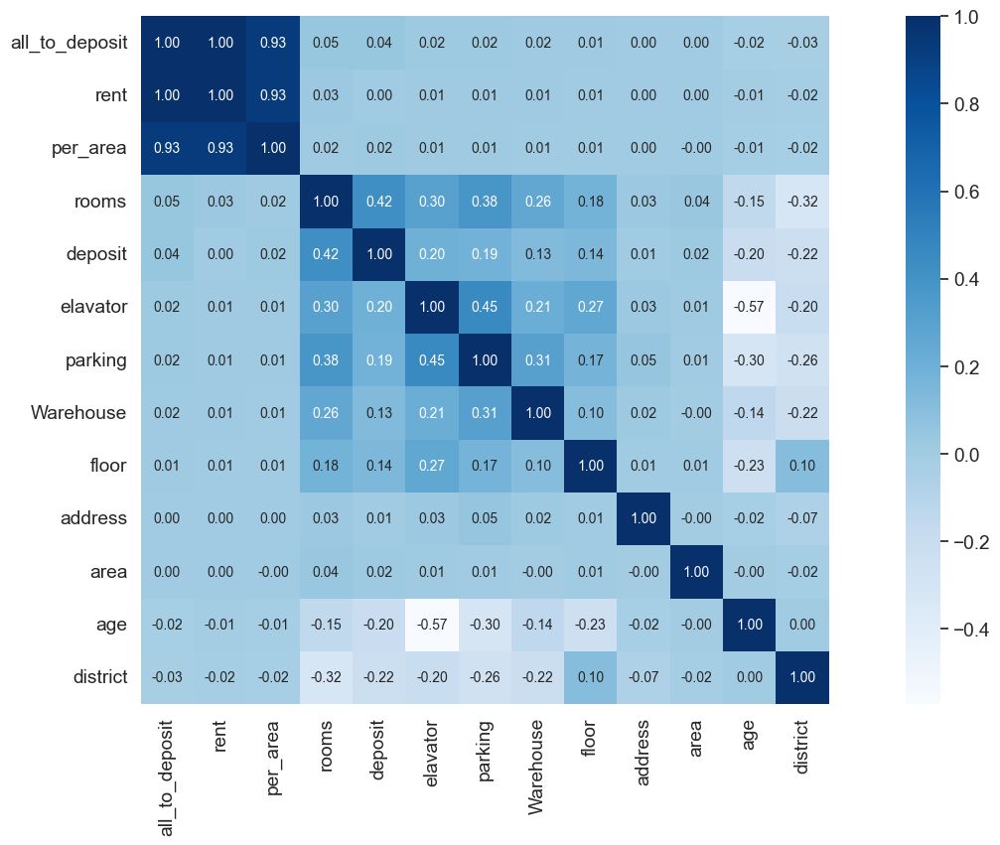

In [82]:
corr = df1.corr()
plt.figure(figsize=(20, 9))
k = 14 #number of variables for heatmap
cols = corr.nlargest(k, 'all_to_deposit')['all_to_deposit'].index
cm = np.corrcoef(df1[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values,cmap="Blues")
plt.show()

## Model Selection 

In [83]:
df2 = df1.copy()
df2=df2.drop(['rent','deposit'],axis=1)
y=df2.pop('all_to_deposit')
X=df2
## خب اینجا ما فیچر ها و تارگتمون رو مشخص کردیم پس بریم حالا باهاش مدل های مختلف بزنیم


## Linear Regression:

In [84]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=0)

In [85]:
regmodel=LinearRegression()
regmodel.fit(X_train,y_train)

LinearRegression()

In [86]:
y_pred=regmodel.predict(X_test)

In [87]:
print('r2_score: ',metrics.r2_score(y_test,y_pred))
print('mean_squared_error: ',metrics.mean_squared_error(y_test,y_pred))
print('mean_absolute_error: ',metrics.mean_absolute_error(y_test,y_pred))

r2_score:  0.8690985222995005
mean_squared_error:  66828792.73952046
mean_absolute_error:  698.1093145275905


In [88]:
## خب میبینیم که دقت مدل حدودا 86 در هست که بدک نیست اما ببینیم میشه با وزن دادن بهش اون رو بهتر کرد یا نه؟

## polynomial Linear Regression

In [89]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0)

In [90]:
poly=PolynomialFeatures(degree=2)
X_train_quad=poly.fit_transform(X_train)
X_test_quad=poly.fit_transform(X_test)
polymodel=LinearRegression()

In [91]:
polymodel.fit(X_train_quad,y_train)

LinearRegression()

In [92]:
y_pred_quad=polymodel.predict(X_test_quad)
y_pred2=y_pred_quad

In [93]:
print(y_pred_quad.shape)
print(y_test.shape)

(32772,)
(32772,)


In [94]:
print('r2_score: ',metrics.r2_score(y_test,y_pred_quad))
print('explained_variance_score: ',metrics.explained_variance_score(y_test,y_pred_quad))
print('mean_squared_error: ',metrics.mean_squared_error(y_test,y_pred_quad))
print('mean_absolute_error: ',metrics.mean_absolute_error(y_test,y_pred_quad))

r2_score:  1.0
explained_variance_score:  1.0
mean_squared_error:  8.522016744967452e-19
mean_absolute_error:  2.8657236145775874e-10


Text(0, 0.5, 'y_pred')

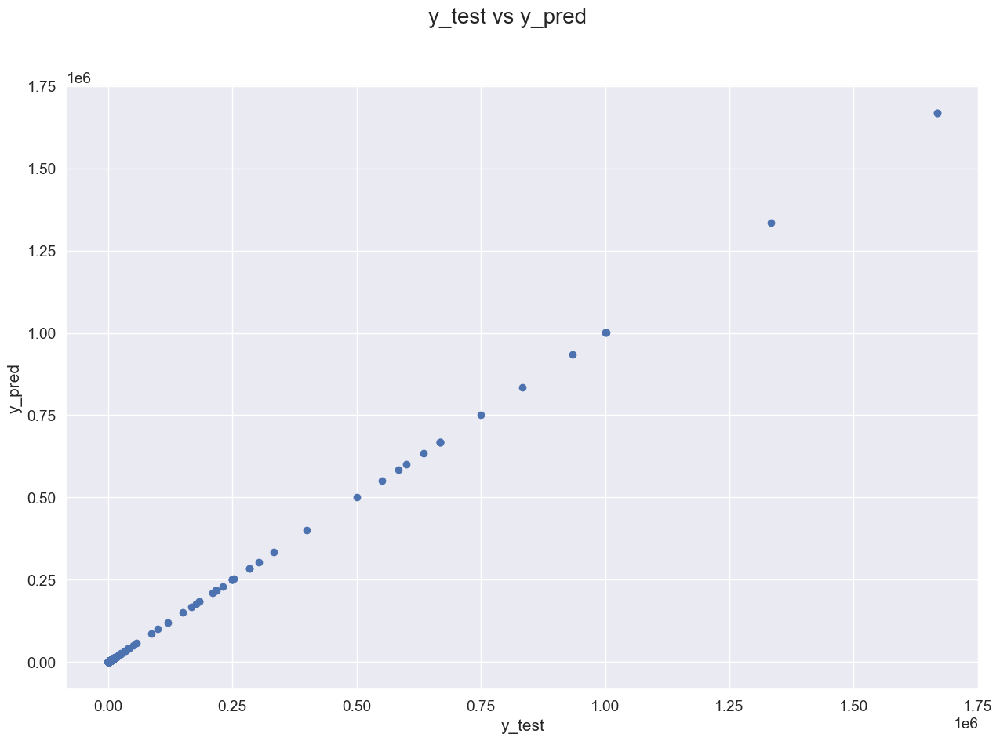

In [95]:
fig = plt.figure(figsize=(15,10))
plt.scatter(y_test,y_pred_quad)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test')                          # X-label
plt.ylabel('y_pred') 

In [96]:
# میبینید که دقت 1 شده و این اصلا خوب نیست چون یعنی اورفیت شده پس نمیشه روش حساب باز کنیم!
#بریم سراغ روش بعدی:

## Regression Decision Trees:

In [97]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.4,random_state=0)

In [98]:
regression_tree_houses = DecisionTreeRegressor()
regression_tree_houses.fit(X_train, y_train)

DecisionTreeRegressor()

In [99]:
y_pred_tree = regression_tree_houses.predict(X_test)

In [100]:
print('r2_score: ',metrics.r2_score(y_test,y_pred_tree))
print('explained_variance_score: ',metrics.explained_variance_score(y_test,y_pred_tree))
print('mean_squared_error: ',metrics.mean_squared_error(y_test,y_pred_tree))
print('mean_absolute_error: ',metrics.mean_absolute_error(y_test,y_pred_tree))

r2_score:  0.9718843383623006
explained_variance_score:  0.9718846847482833
mean_squared_error:  14335810.314079093
mean_absolute_error:  64.84193823996094


Text(0, 0.5, 'y_pred')

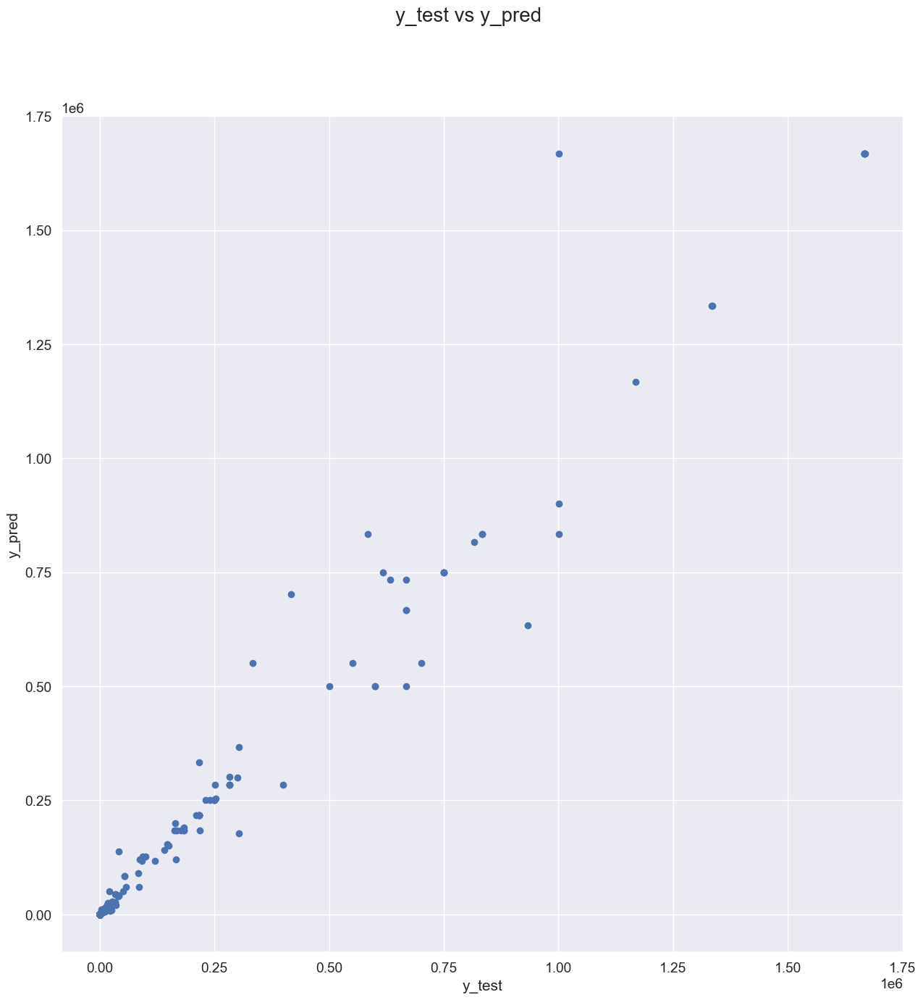

In [101]:
fig = plt.figure()
plt.scatter(y_test,y_pred_tree)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test')                          # X-label
plt.ylabel('y_pred')